In [1]:
import os
import numpy
import pandas
import xarray
import netCDF4 as nc
import cartopy.crs
import cmocean
import rioxarray
from array import *
from cmocean import cm as cmo
from glob import glob
from cartopy import crs,feature
import matplotlib as mpl
from matplotlib import pyplot as plt, patches, colors
from mpl_toolkits.axes_grid1 import make_axes_locatable
from pathlib import Path
# used to make subplot labels consistent between figures
from matplotlib.offsetbox import AnchoredText
#from salishsea_tools import geo_tools, tidetools

In [2]:
graphics_dir = Path('/ocean/rmueller/MIDOSS/graphics/')
geotiff_directory = Path('/data/MIDOSS/geotiffs')
# larger, presentation-size graphics require different xy text specifications
graphics_size='large'
if graphics_size=='large':
    # graphics style
    plt.style.use(r"../style_templates/MuellerEtAl_matplotlibrc.template")

# mapping specifications
rotated_crs = cartopy.crs.RotatedPole(pole_longitude=120.0, pole_latitude=63.75)
plain_crs = cartopy.crs.PlateCarree()
# linewidth for coast/rivers
lw=0.3
# reducd dpi to make smaller graphics
custom_dpi=600

In [3]:
mask = xarray.open_dataset('/data/bmoorema/MEOPAR/grid/mesh_mask201702.nc')
coords = xarray.open_dataset('/data/bmoorema/MEOPAR/grid/coordinates_seagrid_SalishSea201702.nc', decode_times=False)
bathy = xarray.open_dataset('/data/bmoorema/MEOPAR/grid/bathymetry_201702.nc')
spills = pandas.read_csv('/data/sallen/results/MIDOSS/Monte_Carlo/northern_strait.csv')

# Load ETOPO1 data set
topo = xarray.open_dataset('/ocean/bmoorema/research/MEOPAR/analysis-ben/data/ETOPO1_Bed_g_gmt4.grd')

# Crop to Salish Sea
extent = [-126.5, -121.2, 46.8, 51.2]
topo_salishsea = topo.sel(x=slice(*extent[:2]), y=slice(*extent[2:]))
lon, lat = [coords[var][0, ...].values for var in ('glamt', 'gphit')]
#lon, lat, depth = [topo_salishsea[var].values for var in ('x', 'y', 'z')]
tmask = mask.tmask[0, 0, ...].values

In [4]:
spills_dir_name = 'spill_files_091921'
# On Salish
data_directory = Path(f'/ocean/rmueller/MIDOSS/{spills_dir_name}')
graphics_directory = Path('/ocean/rmueller/MIDOSS/graphics/MEOPAR_ASM_2022')
# Load Oil Attribution file 
oil_attribution_file = '/data/MIDOSS/marine_transport_data/oil_attribution.yaml'
# create list of spill files to plot/evaluate
filenames = sorted(glob(os.path.join(data_directory,"*.csv")))

our_spills = '/data/sallen/results/MIDOSS/'+\
'SalishSea_oil_spills_corrected_24mar2022_indomain_fixedcol_fixedwrap.csv'


# load spills files

In [5]:
fnames = [
    'Lagrangian_akns.dat',
    'Lagrangian_bunker.dat',
    'Lagrangian_dilbit.dat',
    'Lagrangian_diesel.dat',
    'Lagrangian_gas.dat',
    'Lagrangian_jet.dat',
    'Lagrangian_other.dat'
]
MIDOSSlabels=[
    'ANS',
    'Bunker-C',
    'Dilbit',
    'Diesel',
    'Diesel',
    'Diesel',
    'Bunker-C'
]

#linewidth for land mask
lw=0.5

# color of shoreline
ec='grey'

# number of bins for histogram
nbins_x=150
nbins_y=150



## Add spills to four corners of grid in each of the 9 spill iteration so that the histogram boxes are consistent

In [6]:
# this is a very kludgy way to set the bin bounds 

# # create lon/lat bins
# hist_bins_x = numpy.arange(lon.min(),lon.max(),numpy.abs(lon.max()-lon.min())/nbins_x)
# hist_bins_y = numpy.arange(lat.min(),lat.max(),numpy.abs(lat.max()-lat.min())/nbins_y)


lon_min, lon_max = lon.min(), lon.max()
lat_min, lat_max = lat.min(), lat.max()

southwest_corner = {
 'spill_date_hour':0,
 'run_days':0,
 'spill_lon':lon_min,
 'spill_lat':lat_min,
 'geotiff_x_index':0,
 'geotiff_y_index':0,
 'vessel_type':0,
 'vessel_len':0,
 'vessel_mmsi':0,
 'vessel_origin':0,
 'vessel_dest':0,
 'fuel_capacity':0,
 'cargo_capacity':0,
 'spill_volume':0,
 'fuel_cargo':0,
 'Lagrangian_template':0
}
northwest_corner = {
 'spill_date_hour':0,
 'run_days':0,
 'spill_lon':lon_min,
 'spill_lat':lat_max,
 'geotiff_x_index':0,
 'geotiff_y_index':0,
 'vessel_type':0,
 'vessel_len':0,
 'vessel_mmsi':0,
 'vessel_origin':0,
 'vessel_dest':0,
 'fuel_capacity':0,
 'cargo_capacity':0,
 'spill_volume':0,
 'fuel_cargo':0,
 'Lagrangian_template':0
}
northeast_corner = {
 'spill_date_hour':0,
 'run_days':0,
 'spill_lon':lon_max,
 'spill_lat':lat_max,
 'geotiff_x_index':0,
 'geotiff_y_index':0,
 'vessel_type':0,
 'vessel_len':0,
 'vessel_mmsi':0,
 'vessel_origin':0,
 'vessel_dest':0,
 'fuel_capacity':0,
 'cargo_capacity':0,
 'spill_volume':0,
 'fuel_cargo':0,
 'Lagrangian_template':0
}
southeast_corner = {
 'spill_date_hour':0,
 'run_days':0,
 'spill_lon':lon_max,
 'spill_lat':lat_min,
 'geotiff_x_index':0,
 'geotiff_y_index':0,
 'vessel_type':0,
 'vessel_len':0,
 'vessel_mmsi':0,
 'vessel_origin':0,
 'vessel_dest':0,
 'fuel_capacity':0,
 'cargo_capacity':0,
 'spill_volume':0,
 'fuel_cargo':0,
 'Lagrangian_template':0
}

In [7]:
df={}
for index,fn in enumerate(filenames):    
    if index==3:
        print(index,our_spills)
        df[index] = pandas.read_csv(our_spills)
    else:
        print(index,fn)
        df[index] = pandas.read_csv(fn)
    # rename lagrangian files as oil types (for plotting)
    df[index]['Lagrangian_template'] = df[index]['Lagrangian_template'].replace(
         fnames, MIDOSSlabels
    )
    if index == 0:
        df_combined = df[index].copy()
        
    else:
        df_combined = pandas.concat([df_combined, df[index]])
    # add four corners of grid by appending new lines
    df[index].loc[len(df[index])]= southwest_corner
    df[index].loc[len(df[index])]= northwest_corner
    df[index].loc[len(df[index])]= northeast_corner
    df[index].loc[len(df[index])]= southeast_corner
    if index == 8:
        df_combined.loc[len(df_combined)]= southwest_corner
        df_combined.loc[len(df_combined)]= northwest_corner
        df_combined.loc[len(df_combined)]= northeast_corner
        df_combined.loc[len(df_combined)]= southeast_corner

oil_types = df[3]['Lagrangian_template'].explode().unique().tolist()   

0 /ocean/rmueller/MIDOSS/spill_files_091921/SalishSea_oil_spills_1.csv
1 /ocean/rmueller/MIDOSS/spill_files_091921/SalishSea_oil_spills_2.csv
2 /ocean/rmueller/MIDOSS/spill_files_091921/SalishSea_oil_spills_3.csv
3 /data/sallen/results/MIDOSS/SalishSea_oil_spills_corrected_24mar2022_indomain_fixedcol_fixedwrap.csv
4 /ocean/rmueller/MIDOSS/spill_files_091921/SalishSea_oil_spills_5.csv
5 /ocean/rmueller/MIDOSS/spill_files_091921/SalishSea_oil_spills_6.csv
6 /ocean/rmueller/MIDOSS/spill_files_091921/SalishSea_oil_spills_7.csv
7 /ocean/rmueller/MIDOSS/spill_files_091921/SalishSea_oil_spills_8.csv
8 /ocean/rmueller/MIDOSS/spill_files_091921/SalishSea_oil_spills_9.csv


## combine spills by oil and across all oils

In [8]:
df_90K_oils = {}
df_90K = {}
for run in numpy.arange(len(df)):
    if run==0:
        df_90K = df[run].copy()
    else:
        df_90K = pandas.concat([df_90K,df[run]],axis=0)
    print(len(df[run]),len(df_90K))
    if run == 8:
            df_90K.loc[len(df_90K)]= southwest_corner
            df_90K.loc[len(df_90K)]= northwest_corner
            df_90K.loc[len(df_90K)]= northeast_corner
            df_90K.loc[len(df_90K)]= southeast_corner
for oil_type in oil_types:
    #df_90K_oils[oil_type]={}
    for run in numpy.arange(len(df)):
        #df_90K_oils[oil_type][run]=df[run][df[run]['Lagrangian_template']==oil_type]
        if run==0:
            df_90K_oils[oil_type]=df[run][df[run]['Lagrangian_template']==oil_type].copy()
        else:
            df_90K_oils[oil_type]=pandas.concat([df_90K_oils[oil_type], df[run][df[run]['Lagrangian_template']==oil_type]], axis=0) 
        if index == 8:
            df_90K_oils[oil_type].loc[len(df_90K_oils[oil_type])]= southwest_corner
            df_90K_oils[oil_type].loc[len(df_90K_oils[oil_type])]= northwest_corner
            df_90K_oils[oil_type].loc[len(df_90K_oils[oil_type])]= northeast_corner
            df_90K_oils[oil_type].loc[len(df_90K_oils[oil_type])]= southeast_corner

10004 10004
10004 20008
10004 30012
9837 39849
10004 49853
10004 59857
10004 69861
10004 79865
10004 89869


In [9]:
rotated_crs = cartopy.crs.RotatedPole(pole_longitude=120.0, pole_latitude=63.75)
plain_crs = cartopy.crs.PlateCarree()

count_arr = numpy.empty((len(df), nbins_x, nbins_y))
vol_arr = numpy.empty((len(df), nbins_x, nbins_y))

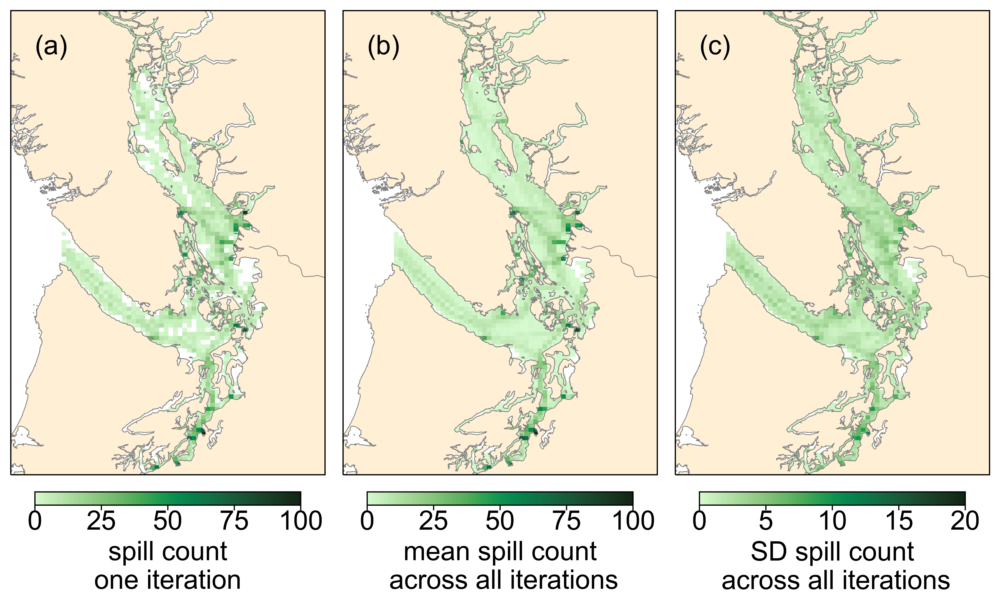

In [10]:
fig, axs = plt.subplots(1, 3, 
    figsize=(12, 7), #(width, height)
    dpi=custom_dpi, 
    subplot_kw={'projection': rotated_crs, 
        "facecolor": "white"},
    gridspec_kw={
       'width_ratios': [1,1,1],
       'height_ratios': [1],
       'wspace': 0,
       'hspace': 0}
)
for ax in axs:
    ax.add_feature(feature.GSHHSFeature(
        'full', edgecolor=ec, linewidth=lw, facecolor='papayawhip',
         zorder=1#, alpha=0.7
    ))
    ax.add_feature(feature.NaturalEarthFeature(
        category='physical', name='rivers_lake_centerlines',
        scale='10m',  edgecolor=ec, linewidth=lw, facecolor='none',
        zorder=1#, alpha=0.7
    ))
    ax.set_extent([-124, -123.75, lat.min()-0.15, lat.max()])
    ax.set_aspect(1)

# do coordinate conversion of (x,y)
xynps = axs[0].projection.transform_points(
    plain_crs, 
    numpy.array(df[3].spill_lon), 
    numpy.array(df[3].spill_lat))

# ~~~ Number of spills ~~~
# calculate histograms for number of spills and plot using pcolormesh
r3_count,xe,ye = numpy.histogram2d(
    xynps[:,0], 
    xynps[:,1],
    bins=(nbins_x,nbins_y)
);
r3_count[numpy.where(r3_count==0)] = numpy.NaN 

Yr,Xr = numpy.meshgrid(ye,xe)

# ~~~ Volume of spills ~~~

# calculate histograms for number of spills and plot using pcolormesh
r3_vol,xe,ye = numpy.histogram2d(
    xynps[:,0], 
    xynps[:,1], 
    weights = df[3].spill_volume,
    bins=(nbins_x,nbins_y)
); 
r3_vol[numpy.where(r3_vol==0)] = numpy.NaN 

# loop through runs and calculate the mean and standard deviation
for run in numpy.arange(len(df)):
    
    # do coordinate conversion of (x,y)
    xynps = axs[0].projection.transform_points(
        crs.Geodetic(), 
        numpy.array(df[run].spill_lon), 
        numpy.array(df[run].spill_lat))

    # ~~~ Number of spills ~~~
    # calculate histograms for number of spills and plot using pcolormesh
    count_arr[run,:,:],xe,ye = numpy.histogram2d(
        xynps[:,0], 
        xynps[:,1],
        bins=(nbins_x,nbins_y)
    );
 

    Yr,Xr = numpy.meshgrid(ye,xe)

    # ~~~ Volume of spills ~~~
    # calculate histograms for number of spills and plot using pcolormesh
    vol_arr[run,:,:],xe,ye = numpy.histogram2d(
        xynps[:,0], 
        xynps[:,1], 
        weights = df[run].spill_volume,
        bins=(nbins_x,nbins_y)
    ); 

# assign values and set zero to NaN
mean_count = count_arr.mean(axis=0)
mean_count[numpy.where(mean_count==0)] = numpy.NaN

std_count = count_arr.std(axis=0)
std_count[numpy.where(std_count==0)] = numpy.NaN 

    
# ~~~~~~ count graphics ~~~~~~~~~~~

C3_count=axs[0].pcolormesh(Xr, Yr, r3_count, 
    cmap=cmo.algae,
    vmin=0,
    vmax=100,
    zorder=0)
Cavg_count=axs[1].pcolormesh(Xr, Yr, mean_count, 
    cmap=cmo.algae,
    vmin=0,
    vmax=100,
    zorder=0)
Cstd_count=axs[2].pcolormesh(Xr, Yr, std_count, 
    cmap=cmo.algae,
    vmin=0,
    vmax=20,
    zorder=0)

# Add colorbars
cbar0=fig.colorbar(C3_count, 
    ax=axs[0], 
    pad=0.03, shrink=0.8,
    location='bottom', 
    label='spill count\none iteration',
    ticks=[0,25,50,75,100],
    format=mpl.ticker.FixedFormatter(['0','25','50','75','100']))
cbar0=fig.colorbar(Cavg_count, 
    ax=axs[1], 
    pad=0.03, shrink=0.8,
    location='bottom', 
    label='mean spill count\n across all iterations',
    ticks=[0,25,50,75,100],
    format=mpl.ticker.FixedFormatter(['0','25','50','75','100']) )
cbar0=fig.colorbar(Cstd_count, 
    ax=axs[2], 
    pad=0.03, shrink=0.8,
    location='bottom', 
    label='SD spill count\n across all iterations',
    ticks=[0,5,10,15,20],
    format=mpl.ticker.FixedFormatter(['0','5','10','15','20']) )

# Use anchored text to make location of subplot labels consistent between figures
a_anchored = AnchoredText("(a)", loc=2, frameon=False)
b_anchored = AnchoredText("(b)", loc=2, frameon=False)
c_anchored = AnchoredText("(c)", loc=2, frameon=False)

axs[0].add_artist(a_anchored)
axs[1].add_artist(b_anchored)
axs[2].add_artist(c_anchored)

if custom_dpi>=600:
    plt.savefig(graphics_dir/'Part1_Figure8_3panel_SpillCount.png')
else:
    plt.savefig(graphics_dir/'Part1_Figure8_3panel_SpillCount_small.png')

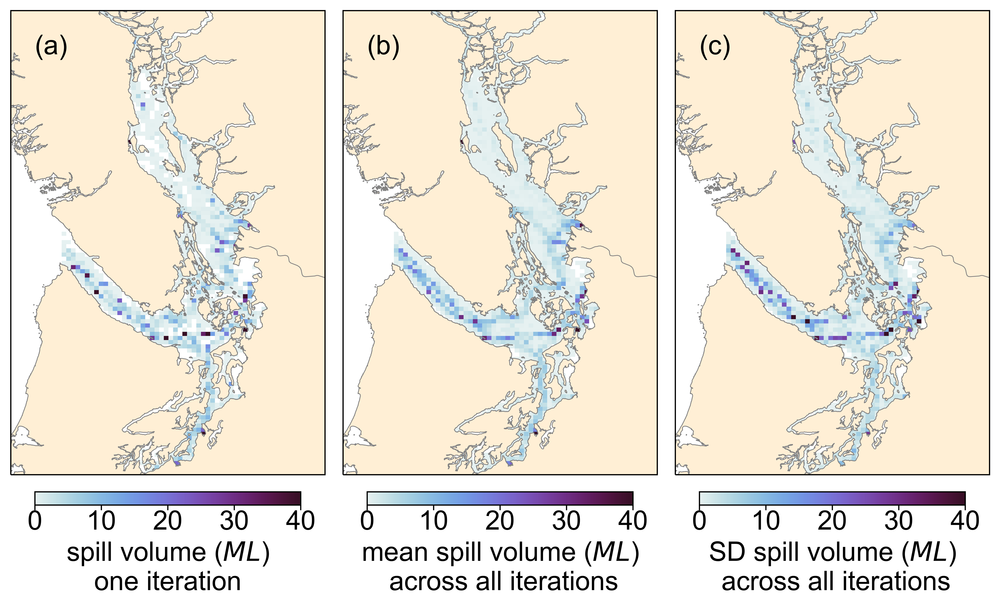

In [11]:
# assign values and set zero to NaN
mean_vol = vol_arr.mean(axis=0)
mean_vol[numpy.where(mean_vol==0)] = numpy.NaN

std_vol = vol_arr.std(axis=0)
std_vol[numpy.where(std_vol==0)] = numpy.NaN 

# plot
fig, axs = plt.subplots(1, 3, 
    figsize=(12, 7), #(width, height)
    dpi=custom_dpi, 
    subplot_kw={'projection': rotated_crs, 
        "facecolor": "white"},
    gridspec_kw={
       'width_ratios': [1,1,1],
       'height_ratios': [1],
       'wspace': 0,
       'hspace': 0}
)
for ax in axs:
    ax.add_feature(feature.GSHHSFeature(
        'full', edgecolor=ec, linewidth=lw, facecolor='papayawhip',
         zorder=1#, alpha=0.7
    ))
    ax.add_feature(feature.NaturalEarthFeature(
        category='physical', name='rivers_lake_centerlines',
        scale='10m',  edgecolor=ec, linewidth=lw, facecolor='none',
        zorder=1#, alpha=0.7
    ))
    ax.set_extent([-124, -123.75, lat.min()-0.15, lat.max()])
    ax.set_aspect(1)

# create meshgrid for combined plots    
xynps = axs[2].projection.transform_points(
    crs.Geodetic(), 
    numpy.array(df_90K.spill_lon), 
    numpy.array(df_90K.spill_lat))
Yr,Xr = numpy.meshgrid(ye,xe)


# ~~~~~~ volume graphics ~~~~~~~~~~~
C3_vol=axs[0].pcolormesh(Xr, Yr, r3_vol, 
    cmap=cmo.dense,
    vmin=0,
    vmax=4e7,
    zorder=0)
Cavg_vol=axs[1].pcolormesh(Xr, Yr, mean_vol, 
    cmap=cmo.dense,
    vmin=0,
    vmax=4e7,
    zorder=0)
Cstd_vol=axs[2].pcolormesh(Xr, Yr, std_vol, 
    cmap=cmo.dense,
    vmin=0,
    vmax=4e7,
    zorder=0)

# Add colorbars
cbar1=fig.colorbar(C3_vol, 
    ax=axs[0],  
    pad=0.03, shrink=0.8,
    location='bottom',
    label='spill volume ($ML$)\none iteration',
    ticks=[0,1e7,2e7,3e7,4e7],
    format=mpl.ticker.FixedFormatter(['0','10','20','30','40']) )
cbar1=fig.colorbar(Cavg_vol, 
    ax=axs[1],  
    pad=0.03, shrink=0.8,
    location='bottom',
    label='mean spill volume ($ML$)\n across all iterations',
    ticks=[0,1e7,2e7,3e7,4e7],
    format=mpl.ticker.FixedFormatter(['0','10','20','30','40']) )
cbar1=fig.colorbar(Cstd_vol, 
    ax=axs[2],  
    pad=0.03, shrink=0.8,
    location='bottom',
    label='SD spill volume ($ML$)\n across all iterations',
    ticks=[0,1e7,2e7,3e7,4e7],
    format=mpl.ticker.FixedFormatter(['0','10','20','30','40']) )


# Use anchored text to make location of subplot labels consistent between figures
a_anchored = AnchoredText("(a)", loc=2, frameon=False)
b_anchored = AnchoredText("(b)", loc=2, frameon=False)
c_anchored = AnchoredText("(c)", loc=2, frameon=False)

axs[0].add_artist(a_anchored)
axs[1].add_artist(b_anchored)
axs[2].add_artist(c_anchored)

if custom_dpi>=600:
    plt.savefig(graphics_dir/'Part1_Figure9_3panel_SpillVolume.png')
else:
    plt.savefig(graphics_dir/'Part1_Figure9_3panel_SpillVolume_small.png')

# Number of spills by oil type for this study

In [12]:
df_oils = {}
for oil_type in oil_types:
    df_oils[oil_type]=df[3][df[3]['Lagrangian_template']==oil_type]

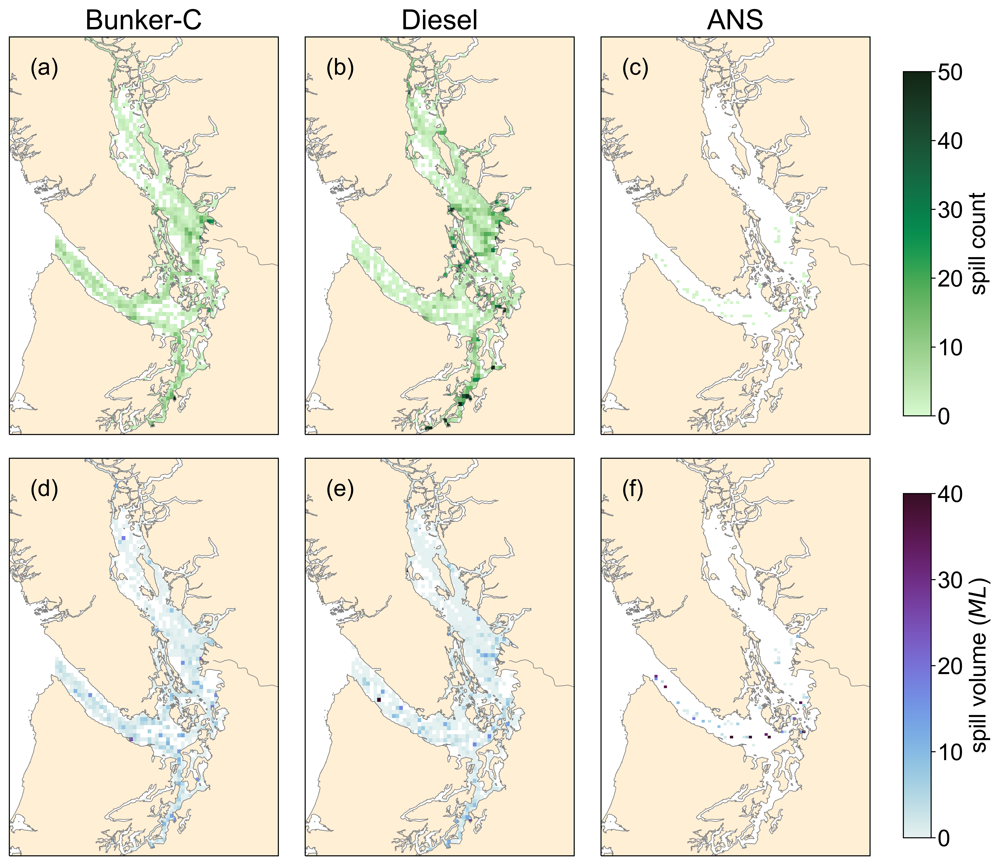

In [13]:
#linewidth for land mask
lw=0.5
label = ["(a)","(b)","(c)","(d)","(e)","(f)"]

# color of shoreline
ec='grey'
nbins_x=50
nbins_y=100

fig, axs = plt.subplots(2, 3, 
    figsize=(12, 12), #(width, height)
    dpi=custom_dpi, 
    subplot_kw={'projection': rotated_crs, 
        "facecolor": "white"},
    gridspec_kw={
       'width_ratios': [1,1,1],
       'height_ratios': [1,1],
       'wspace': 0.1,
       'hspace': 0.01}
)

for idy in [0,1]:
    for idx in [0,1,2]:
        axs[idy,idx].add_feature(feature.GSHHSFeature(
            'full', edgecolor=ec, linewidth=lw, facecolor='papayawhip',
             zorder=1#, alpha=0.7
        ))
        axs[idy,idx].add_feature(feature.NaturalEarthFeature(
            category='physical', name='rivers_lake_centerlines',
            scale='10m',  edgecolor=ec, linewidth=lw, facecolor='none',
            zorder=1#, alpha=0.7
        ))
        axs[idy,idx].set_extent([-124, -123.75, lat.min()-0.15, lat.max()])
        axs[idy,idx].set_aspect(1)

for idx,oil in enumerate(oil_types[0:3]):
    
    # do coordinate conversion of (x,y)
    xynps = axs[0, idx].projection.transform_points(
        crs.Geodetic(), 
        numpy.array(df_oils[oil].spill_lon), 
        numpy.array(df_oils[oil].spill_lat)
    )

    # ~~~ Number of spills ~~~
    # calculate histograms for number of spills and plot using pcolormesh
    spill_count,xe,ye = numpy.histogram2d(
        xynps[:,0], 
        xynps[:,1],
        bins=(nbins_x,nbins_y)
    );
    spill_count[numpy.where(spill_count==0)] = numpy.NaN 

    Yr,Xr = numpy.meshgrid(ye,xe)

    # ~~~ Volume of spills ~~~
    # calculate histograms for number of spills and plot using pcolormesh
    spill_vol,xe,ye = numpy.histogram2d(
        xynps[:,0], 
        xynps[:,1], 
        weights = df_oils[oil].spill_volume,
        bins=(nbins_x,nbins_y)
    ); 
    spill_vol[numpy.where(spill_vol==0)] = numpy.NaN 

    C_count=axs[0,idx].pcolormesh(Xr, Yr, spill_count, 
        cmap=cmo.algae,
        vmin=0,
        vmax=50,
        zorder=0)
    C_vol=axs[1,idx].pcolormesh(Xr, Yr, spill_vol, 
        cmap=cmo.dense,
        vmin=0,
        vmax=4e7,
        zorder=0)

    axs[0,idx].set_title(oil);

    # Use anchored text to make location of subplot labels consistent between figures
    anchored_top = AnchoredText(label[idx], loc=2, frameon=False)
    anchored_bottom = AnchoredText(label[idx+3], loc=2, frameon=False)
    axs[0,idx].add_artist(anchored_top)
    axs[1, idx].add_artist(anchored_bottom)

# Add colorbars
cb_cnt_ax = fig.add_axes([.93,.53,.025,.31])
cb_vol_ax = fig.add_axes([.93,.15,.025,.31])
cbar0=fig.colorbar(C_count, 
    cax=cb_cnt_ax, 
    pad=0.03, shrink=0.8, 
    label='spill count',
    ticks=[0,10,20,30,40,50])
cbar1=fig.colorbar(C_vol, 
    cax=cb_vol_ax,  
    pad=0.03, shrink=0.8,
    label='spill volume ($ML$)',
    ticks=[0,1e7,2e7,3e7,4e7],
    format=mpl.ticker.FixedFormatter(['0','10','20','30','40']))
# cbar0.ax.set_yticklabels([0,10,20,30,40,50])
# cbar1.ax.set_yticklabels([0,10,20])

if custom_dpi>=600:
    plt.savefig(graphics_dir/'Part1_Figure10_Count_Volume_byOil_thisStudy.png')
else:
    plt.savefig(graphics_dir/'Part1_Figure10_Count_Volume_byOil_thisStudy_small.png')
  

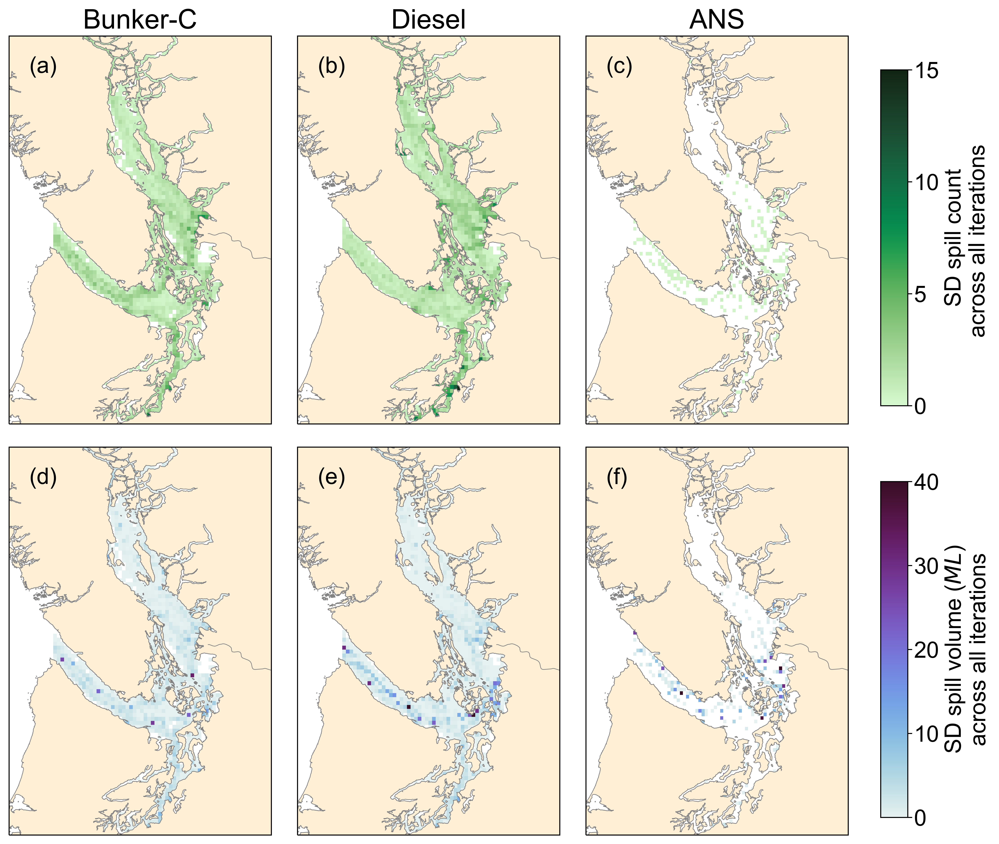

In [14]:
label = ["(a)","(b)","(c)","(d)","(e)","(f)"]

# initialize arrays of size N-iterations, N-oils, nx, ny
count_arr = numpy.empty((len(df), nbins_x, nbins_y))
vol_arr = numpy.empty((len(df), nbins_x, nbins_y))

fig, axs = plt.subplots(2, 3, 
    figsize=(12, 12), #(width, height)
    #sharex=True, sharey=True,#layout="constrained",
    #sharex=True, layout="constrained",
    dpi=custom_dpi, 
    subplot_kw={'projection': rotated_crs, 
        "facecolor": "white"},
    gridspec_kw={
       'width_ratios': [1,1,1],
       'height_ratios': [1,1],
       'wspace': 0.1,
       'hspace': 0.01}
)

for idy in [0,1]:
    for idx in [0,1,2]:
        axs[idy,idx].add_feature(feature.GSHHSFeature(
            'full', edgecolor=ec, linewidth=lw, facecolor='papayawhip',
             zorder=1#, alpha=0.7
        ))
        axs[idy,idx].add_feature(feature.NaturalEarthFeature(
            category='physical', name='rivers_lake_centerlines',
            scale='10m',  edgecolor=ec, linewidth=lw, facecolor='none',
            zorder=1#, alpha=0.7
        ))
        axs[idy,idx].set_extent([-124, -123.75, lat.min()-0.15, lat.max()])
        axs[idy,idx].set_aspect(1)


for idx,oil in enumerate(oil_types[0:3]):
     
    for run in numpy.arange(len(df)):
    
        # select spills for this oil type and iteration of 10,000 spills
        df_loop = df[run][df[run]['Lagrangian_template']==oil]
       
        # do coordinate conversion of (x,y)
        xynps = axs[0, idx].projection.transform_points(
            crs.Geodetic(), 
            numpy.array(df_loop.spill_lon), 
            numpy.array(df_loop.spill_lat)
        )

        # ~~~ Number of spills ~~~
        # calculate histograms for number of spills and plot using pcolormesh
        count_arr[run,:,:],xe,ye = numpy.histogram2d(
            xynps[:,0], 
            xynps[:,1],
            bins=(nbins_x,nbins_y)
        );


        # ~~~ Volume of spills ~~~
        # calculate histograms for number of spills and plot using pcolormesh
        vol_arr[run,:,:],xe,ye = numpy.histogram2d(
            xynps[:,0], 
            xynps[:,1], 
            weights = df_loop.spill_volume,
            bins=(nbins_x,nbins_y)
        ); 

    # calculate standard deviation by oil type
    std_count = count_arr.std(axis=0) 
    std_vol = vol_arr.std(axis=0)

    # set zero to NaN for graphical purposes
    std_count[numpy.where(std_count==0)] = numpy.NaN 
    std_vol[numpy.where(std_vol==0)] = numpy.NaN
    
    
    # create meshgrid
    Yr,Xr = numpy.meshgrid(ye,xe)
    
    C_count=axs[0,idx].pcolormesh(Xr, Yr, std_count, 
        cmap=cmo.algae,
        vmin=0,
        vmax=15,
        zorder=0)
    C_vol=axs[1,idx].pcolormesh(Xr, Yr, std_vol, 
        cmap=cmo.dense,
        vmin=0,
        vmax=4e7,
        zorder=0)

    axs[0,idx].set_title(oil);

    # Use anchored text to make location of subplot labels consistent between figures
    anchored_top = AnchoredText(label[idx], loc=2, frameon=False)
    anchored_bottom = AnchoredText(label[idx+3], loc=2, frameon=False)
    axs[0,idx].add_artist(anchored_top)
    axs[1, idx].add_artist(anchored_bottom)

# Add colorbars
cb_cnt_ax = fig.add_axes([.93,.53,.025,.31])
cb_vol_ax = fig.add_axes([.93,.15,.025,.31])

cbar0=fig.colorbar(C_count, 
    cax=cb_cnt_ax, 
    pad=0.03, shrink=0.8, 
    label='SD spill count\nacross all iterations ',
    ticks=[0,5,10,15],
    format=mpl.ticker.FixedFormatter(['0','5','10','15']))
cbar1=fig.colorbar(C_vol, 
    cax=cb_vol_ax,  
    pad=0.03, shrink=0.8,
    label='SD spill volume ($ML$)\nacross all iterations',
    ticks=[0,1e7,2e7,3e7,4e7],
    format=mpl.ticker.FixedFormatter(['0','10','20','30','40']))

if custom_dpi>=600:
    plt.savefig(graphics_dir/'Part1_Figure11_Count_Volume_byOil_90K.png')
else:
    plt.savefig(graphics_dir/'Part1_Figure11_Count_Volume_byOil_90K_small.png')